## Style-transfer Notebook:

This notebook implements style transfer by optimizing the input image to fit the styles of the output image.

### Disclaimer:
This notebook is based heavily on the style-transfer tutorial provided 
by [Magnus Erik Hvass Pedersen](http://www.hvass-labs.org/)
/ [GitHub](https://github.com/Hvass-Labs/TensorFlow-Tutorials) / [Videos on YouTube](https://www.youtube.com/playlist?list=PL9Hr9sNUjfsmEu1ZniY0XpHSzl5uihcXZ)

I will be experimenting with different possibilites in this notebook <br />
### Major Differences/Change: <br />
1. Added visualization of convolutional layers to better understand extracted features (Done)
2. Experimentation with various parameters to obtain the desired results (Done)
3. Modify to use Keras Pre-trained notebooks
4. Modify to use BFGS to optimize the image

In [1]:
# Loading the necessary libraries
from IPython.display import Image, display
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import PIL.Image

import keras
# from keras.datasets import mnist
# from keras.models import Sequential, Model
# from keras.preprocessing.image import ImageDataGenerator
# from keras.layers import Dense, Dropout, Flatten,Input, BatchNormalization, Activation
# from keras.layers import Conv2D, MaxPooling2D
# from keras import backend as K
from keras.applications.vgg19 import VGG19
from keras.applications.inception_v3 import InceptionV3
# inception_resnet_v2 import InceptionResNetV2
from Utilities import *

%matplotlib inline

Using TensorFlow backend.


In [2]:
print(tf.__version__)
print(keras.__version__)

1.3.0
2.0.8


In [3]:
## Loading a pre-trained Deep-Neural Network
# network = VGG19(weights='imagenet')
# network.summary()
# model = InceptionV3(weights='imagenet')


import vgg16
vgg16.maybe_download()

Data has apparently already been downloaded and unpacked.


In [4]:
def style_transfer(model, session, content_image, style_image,
                   content_layer_ids, style_layer_ids,
                   weight_content=1.5, weight_style=10.0,
                   weight_denoise=0.3,
                   num_iterations=120, step_size=10.0):

#     model = vgg16.VGG16()

#     # Create a TensorFlow-session.
#     session = tf.InteractiveSession(graph=model.graph)

#     # Print the names of the content-layers.
#     print("Content layers:")
#     print(model.get_layer_names(content_layer_ids))
#     print()

#     visualize_layers(session,model,content_image,content_layer_ids)
    
#     # Print the names of the style-layers.
#     print("Style layers:")
#     print(model.get_layer_names(style_layer_ids))
#     print()
    
#     visualize_layers(session,model,style_image,style_layer_ids)

    # Create the loss-function for the content-layers and -image.
    loss_content = create_content_loss(session=session,
                                       model=model,
                                       content_image=content_image,
                                       layer_ids=content_layer_ids)

    # Create the loss-function for the style-layers and -image.
    loss_style = create_style_loss(session=session,
                                   model=model,
                                   style_image=style_image,
                                   layer_ids=style_layer_ids)    

    # Create the loss-function for the denoising of the mixed-image.
    loss_denoise = create_denoise_loss(model)

    # Create TensorFlow variables for adjusting the values of
    # the loss-functions. This is explained below.
    adj_content = tf.Variable(1e-10, name='adj_content')
    adj_style = tf.Variable(1e-10, name='adj_style')
    adj_denoise = tf.Variable(1e-10, name='adj_denoise')

    # Initialize the adjustment values for the loss-functions.
    session.run([adj_content.initializer,
                 adj_style.initializer,
                 adj_denoise.initializer])

    # Create TensorFlow operations for updating the adjustment values.
    # These are basically just the reciprocal values of the
    # loss-functions, with a small value 1e-10 added to avoid the
    # possibility of division by zero.
    update_adj_content = adj_content.assign(1.0 / (loss_content + 1e-10))
    update_adj_style = adj_style.assign(1.0 / (loss_style + 1e-10))
    update_adj_denoise = adj_denoise.assign(1.0 / (loss_denoise + 1e-10))

    # This is the weighted loss-function that we will minimize
    # below in order to generate the mixed-image.
    # Because we multiply the loss-values with their reciprocal
    # adjustment values, we can use relative weights for the
    # loss-functions that are easier to select, as they are
    # independent of the exact choice of style- and content-layers.
    loss_combined = weight_content * adj_content * loss_content + \
                    weight_style * adj_style * loss_style + \
                    weight_denoise * adj_denoise * loss_denoise

    # Use TensorFlow to get the mathematical function for the
    # gradient of the combined loss-function with regard to
    # the input image.
    gradient = tf.gradients(loss_combined, model.input)

    # List of tensors that we will run in each optimization iteration.
    run_list = [gradient, update_adj_content, update_adj_style, \
                update_adj_denoise]

    # The mixed-image is initialized with random noise.
    # It is the same size as the content-image.
    mixed_image = np.random.rand(*content_image.shape) + 128

    for i in range(num_iterations):
        # Create a feed-dict with the mixed-image.
        feed_dict = model.create_feed_dict(image=mixed_image)

        # Use TensorFlow to calculate the value of the
        # gradient, as well as updating the adjustment values.
        grad, adj_content_val, adj_style_val, adj_denoise_val \
        = session.run(run_list, feed_dict=feed_dict)

        # Reduce the dimensionality of the gradient.
        grad = np.squeeze(grad)

        # Scale the step-size according to the gradient-values.
        step_size_scaled = step_size / (np.std(grad) + 1e-8)

        # Update the image by following the gradient.
        mixed_image -= grad * step_size_scaled

        # Ensure the image has valid pixel-values between 0 and 255.
        mixed_image = np.clip(mixed_image, 0.0, 255.0)

        # Print a little progress-indicator.
#         print ". ", end=""

        # Display status once every 10 iterations, and the last.
        if (i % 1000 == 0) or (i == num_iterations - 1):
            print()
            print("Iteration:", i)

            # Print adjustment weights for loss-functions.
            msg = "Weight Adj. for Content: {0:.2e}, Style: {1:.2e}, Denoise: {2:.2e}"
            print(msg.format(adj_content_val, adj_style_val, adj_denoise_val))

            # Plot the content-, style- and mixed-images.
            plot_images(content_image=content_image,
                        style_image=style_image,
                        mixed_image=mixed_image)
            
    print()
    print("Final image:")
    plot_image_big(mixed_image)

    # Close the TensorFlow session to release its resources.
    session.close()
    
    # Return the mixed-image.
    return mixed_image

## Start of Example 1
- Attempting to convert a Anime cartoon into a realistic image
- Results: The style transfer network was not very successful, unable to capture the style of realistic images.
- Results 2: Interestingly, the network is able to map the styles to the correct object. i.e. Style of the sky to the sky, style of buildings to buildings.
- Conclusion: Not Successful.

## Experimental Observations:
- Changing into a smaller step size would result in a smaller convergence (step_size of 0.1 require 9000 iterations to converge)
- Convolutions layers [0-4] closer to the input captures the details & outline of the image (Good for Content), Convolution layers [5-13] deeper into the network capture more of the style.

In [5]:
content_filename = 'images/Anime3.jpg'
content_image = load_image(content_filename, max_size=None)

In [6]:
style_filename = 'images/buildings300.jpg'
style_image = load_image(style_filename, max_size=None)

In [7]:
# The VGG16-model has 13 convolutional layers.
# This selects all those layers as the style-layers.
# This is somewhat slow to optimize.
style_layer_ids = list(range(3,13))

# You can also select a sub-set of the layers, e.g. like this:
# style_layer_ids = [1, 2, 3, 4]

content_layer_ids = [1,2]

Content layers:
['conv1_2/conv1_2', 'conv2_1/conv2_1']
()
Style layers:
['conv2_2/conv2_2', 'conv3_1/conv3_1', 'conv3_2/conv3_2', 'conv3_3/conv3_3', 'conv4_1/conv4_1', 'conv4_2/conv4_2', 'conv4_3/conv4_3', 'conv5_1/conv5_1', 'conv5_2/conv5_2', 'conv5_3/conv5_3']
()


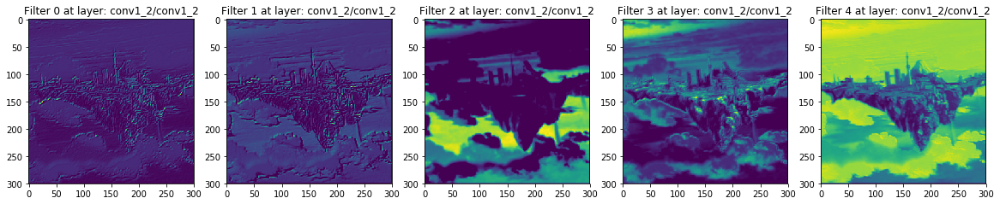

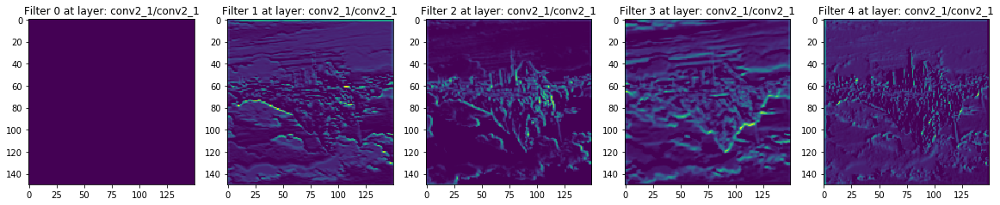

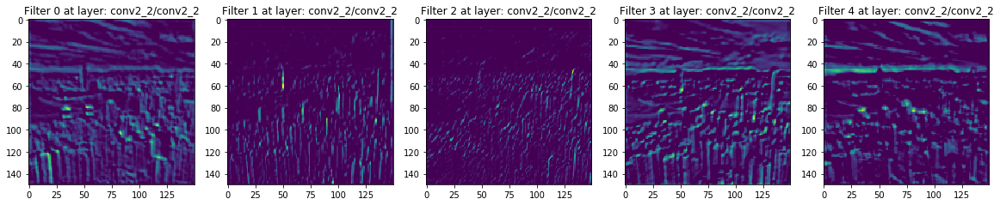

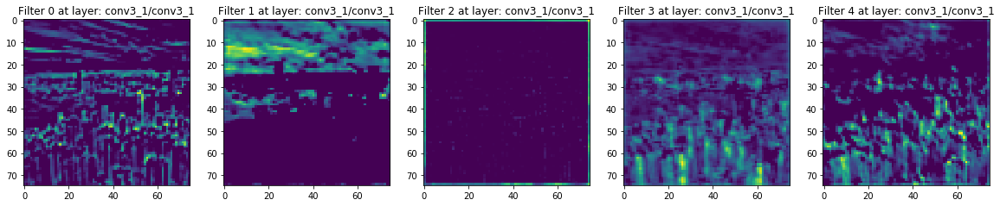

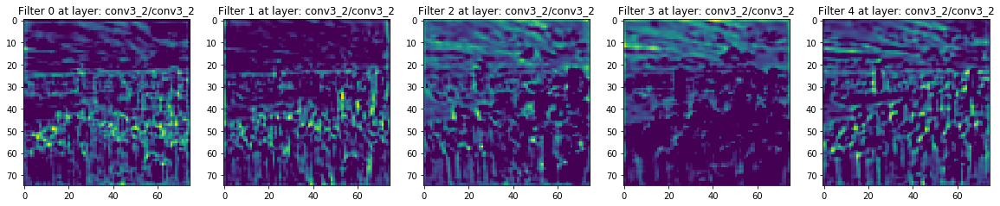

...

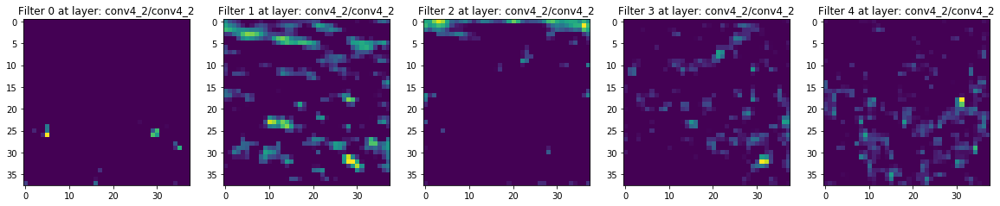

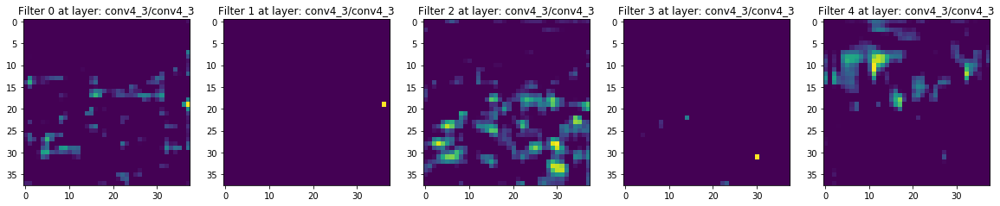

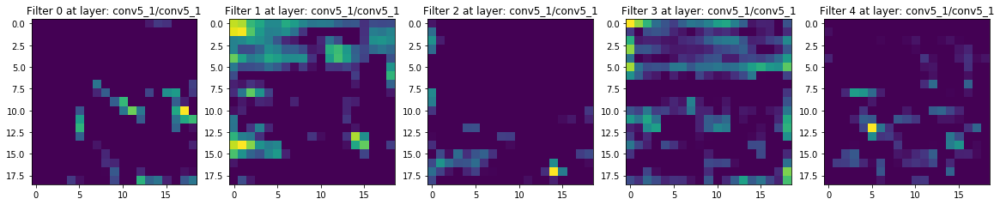

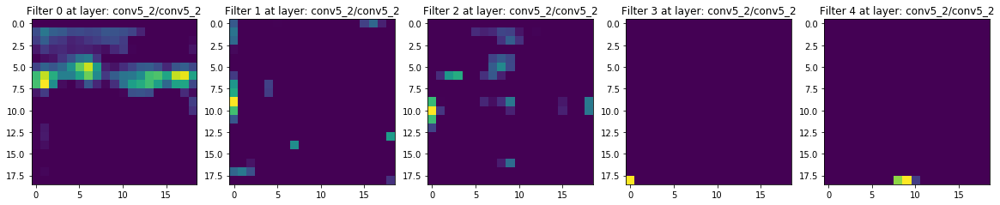

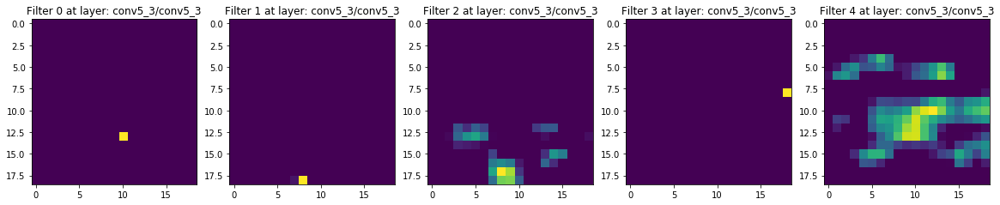

In [8]:
# Visualizing and controlling the layers used 

model = vgg16.VGG16()

# Create a TensorFlow-session.
session = tf.InteractiveSession(graph=model.graph)

# Print the names of the content-layers.
print("Content layers:")
print(model.get_layer_names(content_layer_ids))
print()

visualize_layers(session,model,content_image,content_layer_ids)

# Print the names of the style-layers.
print("Style layers:")
print(model.get_layer_names(style_layer_ids))
print()

visualize_layers(session,model,style_image,style_layer_ids)

()
('Iteration:', 0)
Weight Adj. for Content: 1.68e-10, Style: 1.55e-28, Denoise: 5.57e-06


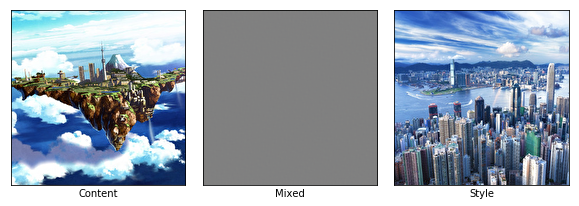

()
('Iteration:', 999)
Weight Adj. for Content: 1.95e-10, Style: 1.37e-25, Denoise: 1.39e-07


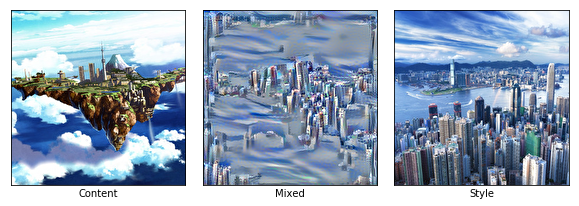

()
Final image:


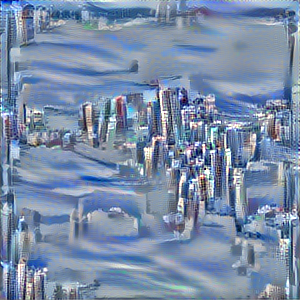

In [9]:
# %%time
img = style_transfer(model, session, content_image=content_image,
                     style_image=style_image,
                     content_layer_ids=content_layer_ids,
                     style_layer_ids=style_layer_ids,
                     weight_content=1.5,
                     weight_style=10.0,
                     weight_denoise=0.3,
                     num_iterations=1000,
                     step_size=0.3)

## Example 2
- This example tries to convert an anime face to painting example
- Results 1: In this case, the style layers also need the shallow level layers to transfer the painting style successfully. Removal of shallow level layers able to achieve slightly better results
- Results: Too little features in the anime face to apply the new style. 
- Conclusion: Not successful

In [10]:
content_filename = 'images/original.jpg'
content_image = load_image(content_filename, max_size=None)

style_filename = 'images/style6.jpg'
style_image = load_image(style_filename, max_size=None)

# The VGG16-model has 13 convolutional layers.
# This selects all those layers as the style-layers.
# This is somewhat slow to optimize.
style_layer_ids = list(range(13))

# You can also select a sub-set of the layers, e.g. like this:
# style_layer_ids = [1, 2, 3, 4]

content_layer_ids = [4]

Content layers:
['conv3_1/conv3_1']
()
Style layers:
['conv1_1/conv1_1', 'conv1_2/conv1_2', 'conv2_1/conv2_1', 'conv2_2/conv2_2', 'conv3_1/conv3_1', 'conv3_2/conv3_2', 'conv3_3/conv3_3', 'conv4_1/conv4_1', 'conv4_2/conv4_2', 'conv4_3/conv4_3', 'conv5_1/conv5_1', 'conv5_2/conv5_2', 'conv5_3/conv5_3']
()


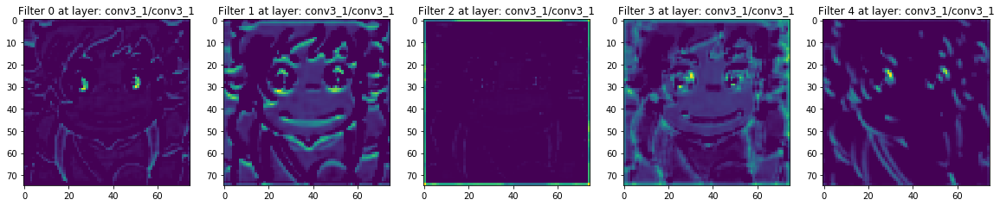

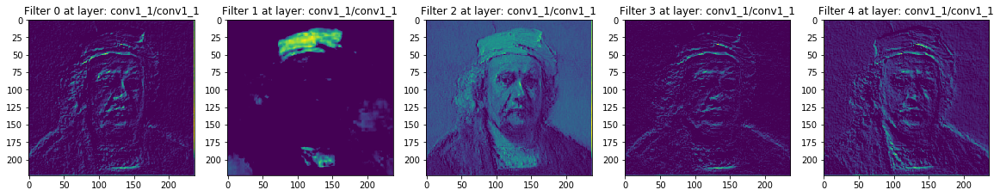

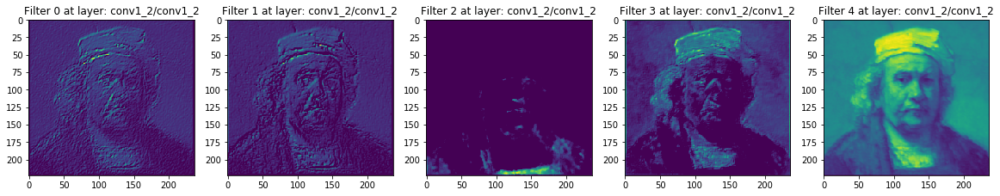

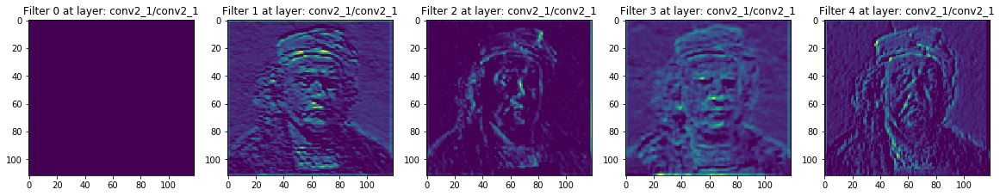

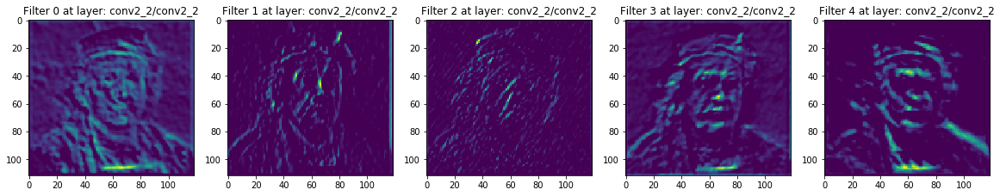

...

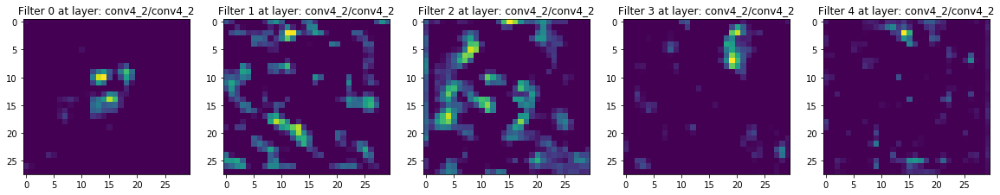

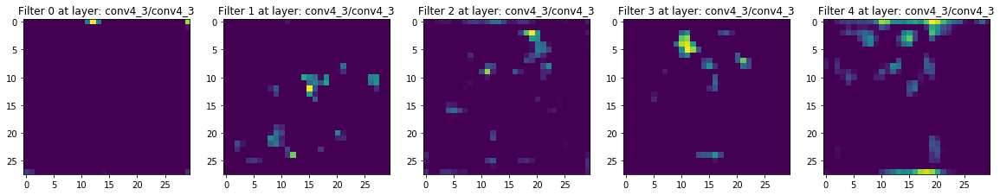

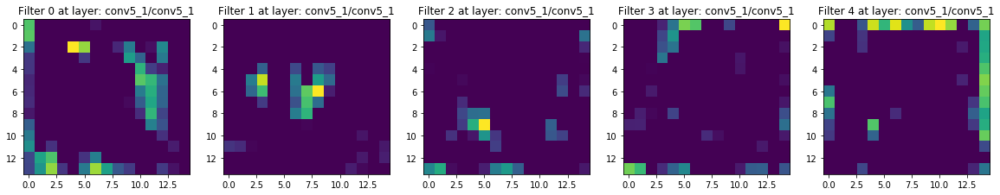

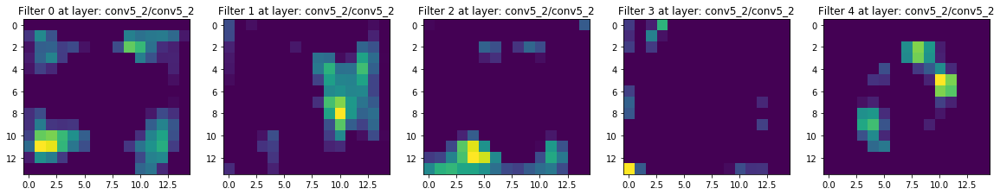

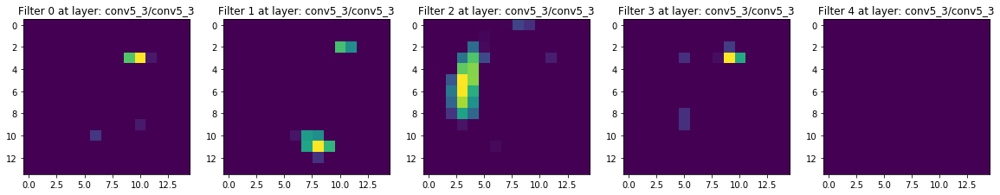

In [11]:
# Visualizing and controlling the layers used 

model = vgg16.VGG16()

# Create a TensorFlow-session.
session = tf.InteractiveSession(graph=model.graph)

# Print the names of the content-layers.
print("Content layers:")
print(model.get_layer_names(content_layer_ids))
print()

visualize_layers(session,model,content_image,content_layer_ids)

# Print the names of the style-layers.
print("Style layers:")
print(model.get_layer_names(style_layer_ids))
print()

visualize_layers(session,model,style_image,style_layer_ids)

()
('Iteration:', 0)
Weight Adj. for Content: 4.07e-11, Style: 6.94e-28, Denoise: 5.57e-06


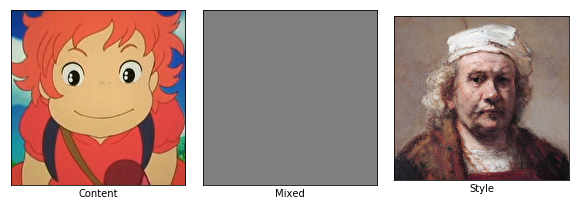

()
('Iteration:', 1000)
Weight Adj. for Content: 4.94e-11, Style: 1.41e-24, Denoise: 3.06e-07


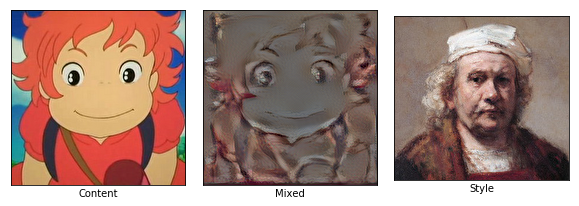

()
('Iteration:', 2000)
Weight Adj. for Content: 4.87e-11, Style: 3.36e-24, Denoise: 2.96e-07


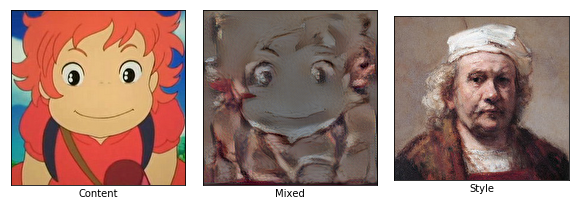

()
('Iteration:', 3000)
Weight Adj. for Content: 4.85e-11, Style: 4.19e-24, Denoise: 2.94e-07


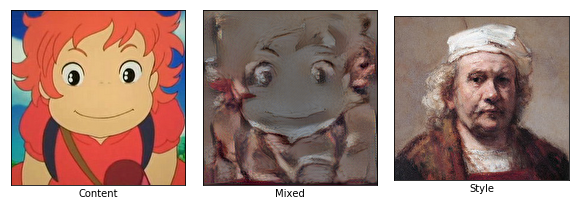

()
('Iteration:', 4000)
Weight Adj. for Content: 4.85e-11, Style: 4.87e-24, Denoise: 2.91e-07


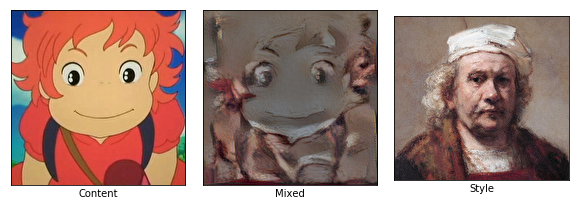

()
('Iteration:', 4999)
Weight Adj. for Content: 4.85e-11, Style: 7.06e-25, Denoise: 2.87e-07


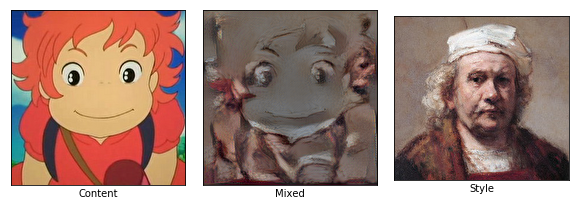

()
Final image:


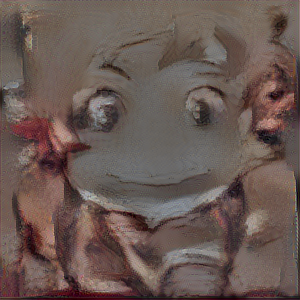

In [12]:
# Visualizing and controlling the layers used 

model = vgg16.VGG16()

# Create a TensorFlow-session.
session = tf.InteractiveSession(graph=model.graph)

img = style_transfer(model, session, content_image=content_image,
                     style_image=style_image,
                     content_layer_ids=content_layer_ids,
                     style_layer_ids=style_layer_ids,
                     weight_content=1.5,
                     weight_style=10.0,
                     weight_denoise=0.3,
                     num_iterations=5000,
                     step_size=0.5)

## Example 3
- In this example apply styles for painting on to a real face image.
- In this case, the style transfer was much more successful due to the more details in the image.

In [35]:
content_filename = 'images/Tzeyu.jpg'
content_image = load_image(content_filename, max_size=None)

style_filename = 'images/style6.jpg'
style_image = load_image(style_filename, max_size=None)

# The VGG16-model has 13 convolutional layers.
# This selects all those layers as the style-layers.
# This is somewhat slow to optimize.
style_layer_ids = list(range(13))

# You can also select a sub-set of the layers, e.g. like this:
# style_layer_ids = [1, 2, 3, 4]

content_layer_ids = [4]

Content layers:
['conv3_1/conv3_1']
()
Style layers:
['conv1_1/conv1_1', 'conv1_2/conv1_2', 'conv2_1/conv2_1', 'conv2_2/conv2_2', 'conv3_1/conv3_1', 'conv3_2/conv3_2', 'conv3_3/conv3_3', 'conv4_1/conv4_1', 'conv4_2/conv4_2', 'conv4_3/conv4_3', 'conv5_1/conv5_1', 'conv5_2/conv5_2', 'conv5_3/conv5_3']
()


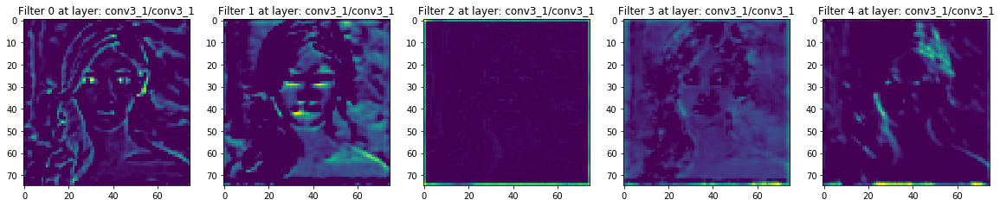

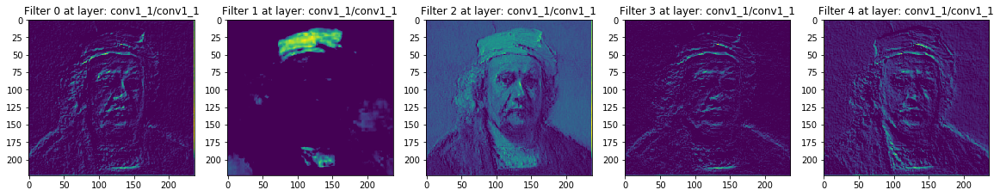

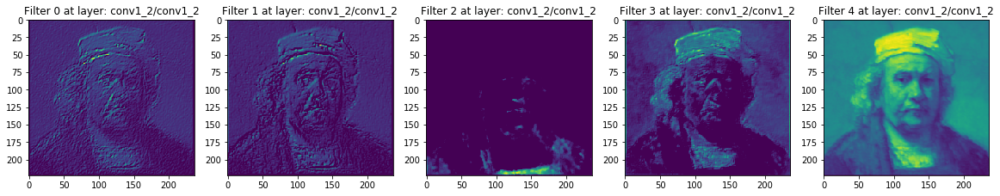

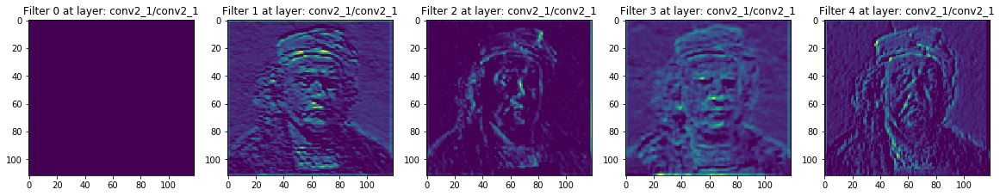

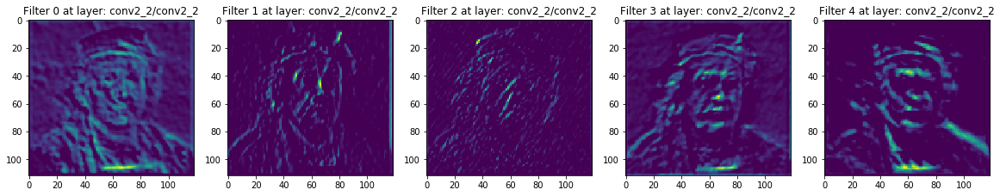

...

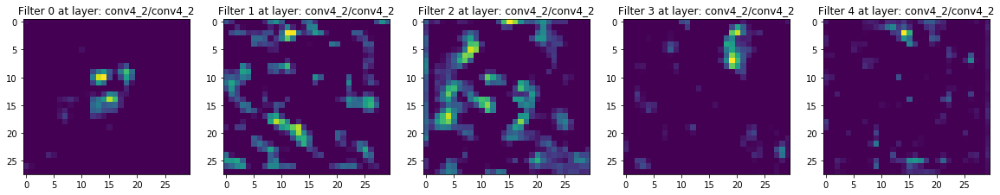

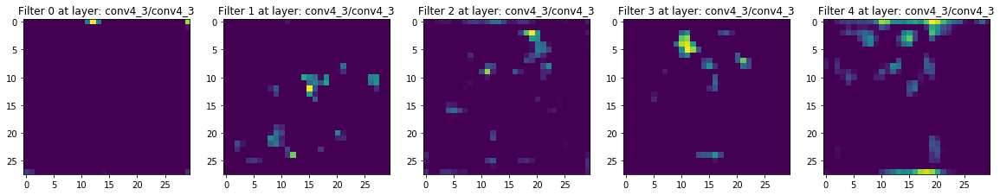

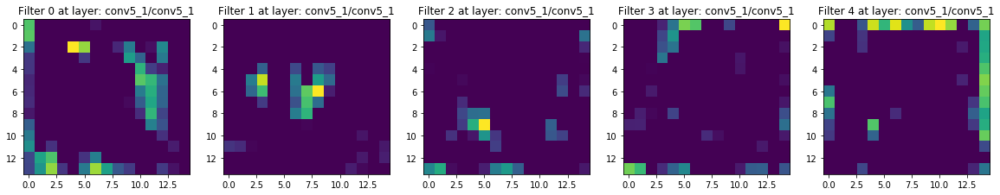

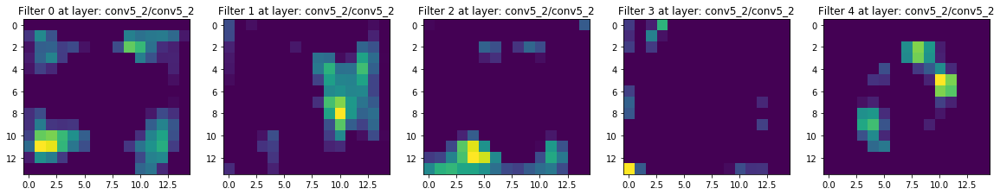

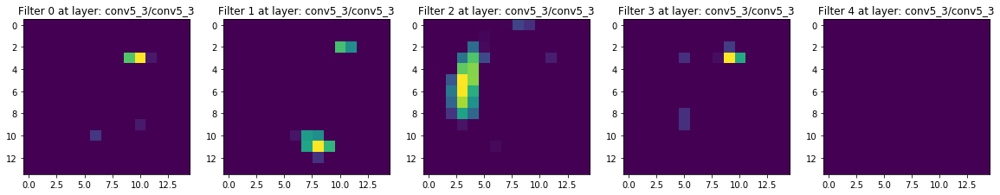

In [36]:
# Visualizing and controlling the layers used 

model = vgg16.VGG16()

# Create a TensorFlow-session.
session = tf.InteractiveSession(graph=model.graph)

# Print the names of the content-layers.
print("Content layers:")
print(model.get_layer_names(content_layer_ids))
print()

visualize_layers(session,model,content_image,content_layer_ids)

# Print the names of the style-layers.
print("Style layers:")
print(model.get_layer_names(style_layer_ids))
print()

visualize_layers(session,model,style_image,style_layer_ids)

()
('Iteration:', 0)
Weight Adj. for Content: 8.46e-11, Style: 6.94e-28, Denoise: 5.58e-06


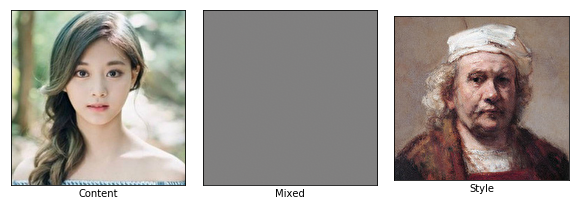

()
('Iteration:', 1000)
Weight Adj. for Content: 1.34e-10, Style: 1.53e-24, Denoise: 3.08e-07


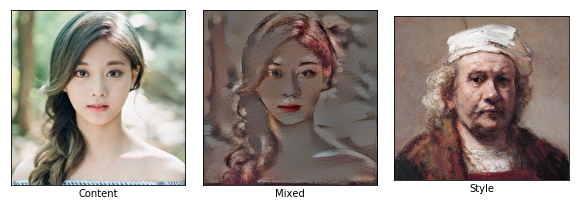

()
('Iteration:', 1999)
Weight Adj. for Content: 1.36e-10, Style: 6.32e-25, Denoise: 2.96e-07


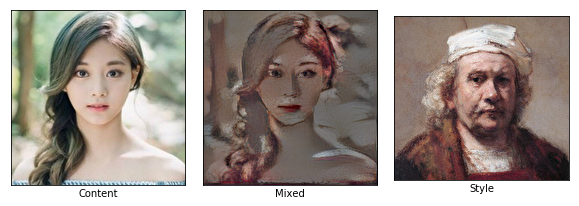

()
Final image:


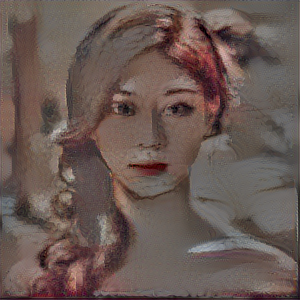

In [37]:
# Visualizing and controlling the layers used 

model = vgg16.VGG16()

# Create a TensorFlow-session.
session = tf.InteractiveSession(graph=model.graph)

img = style_transfer(model, session, content_image=content_image,
                     style_image=style_image,
                     content_layer_ids=content_layer_ids,
                     style_layer_ids=style_layer_ids,
                     weight_content=3.5,
                     weight_style=10.0,
                     weight_denoise=0.3,
                     num_iterations=2000,
                     step_size=0.5)

## Example 4


In [38]:
content_filename = 'images/pexels-photo-281502.jpeg'
content_image = load_image(content_filename, max_size=None)

style_filename = 'images/drawing300.jpg'
style_image = load_image(style_filename, max_size=None)

# The VGG16-model has 13 convolutional layers.
# This selects all those layers as the style-layers.
# This is somewhat slow to optimize.
style_layer_ids = list(range(13))

# You can also select a sub-set of the layers, e.g. like this:
# style_layer_ids = [1, 2, 3, 4]

content_layer_ids = [4]

Content layers:
['conv3_1/conv3_1']
()
Style layers:
['conv1_1/conv1_1', 'conv1_2/conv1_2', 'conv2_1/conv2_1', 'conv2_2/conv2_2', 'conv3_1/conv3_1', 'conv3_2/conv3_2', 'conv3_3/conv3_3', 'conv4_1/conv4_1', 'conv4_2/conv4_2', 'conv4_3/conv4_3', 'conv5_1/conv5_1', 'conv5_2/conv5_2', 'conv5_3/conv5_3']
()


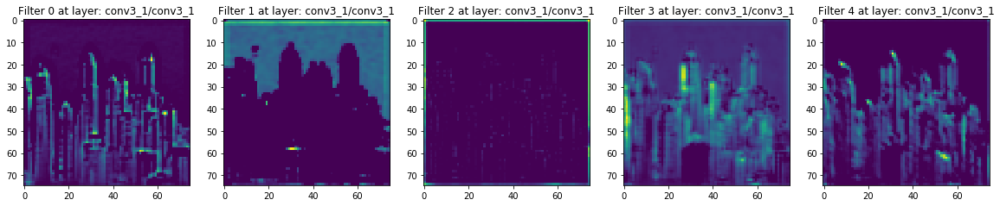

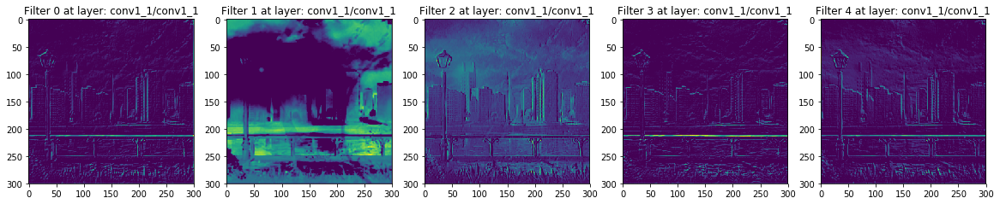

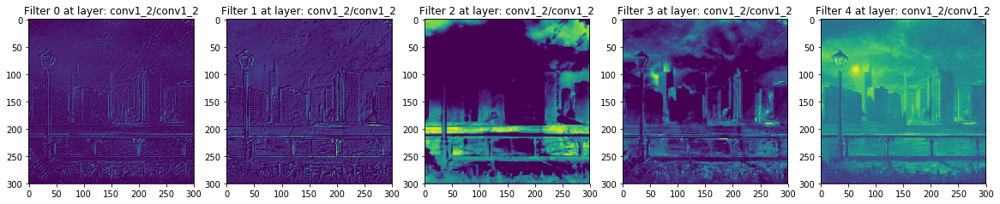

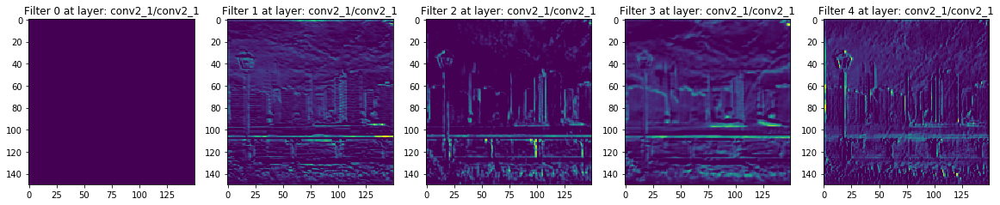

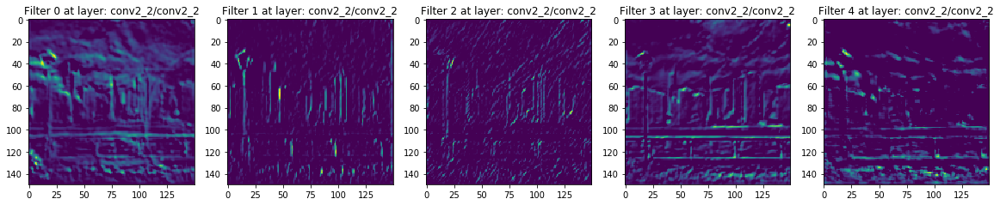

...

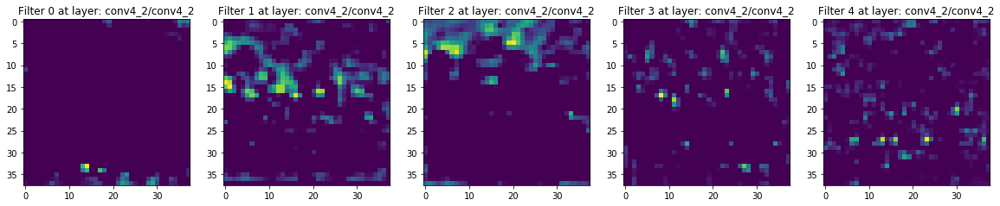

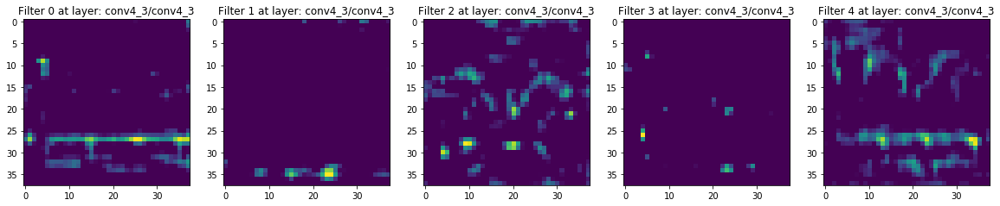

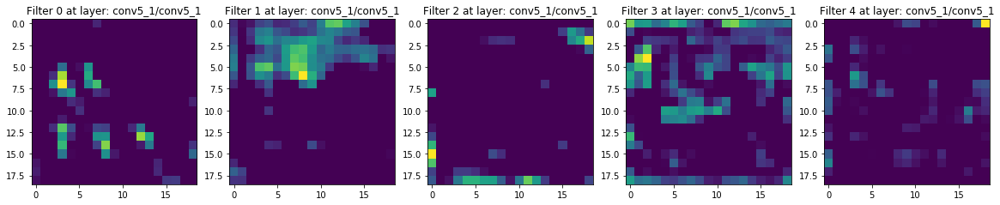

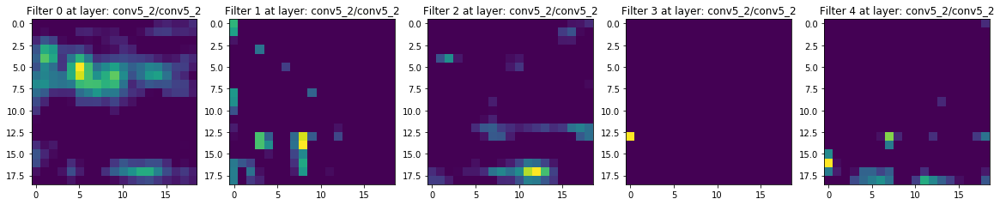

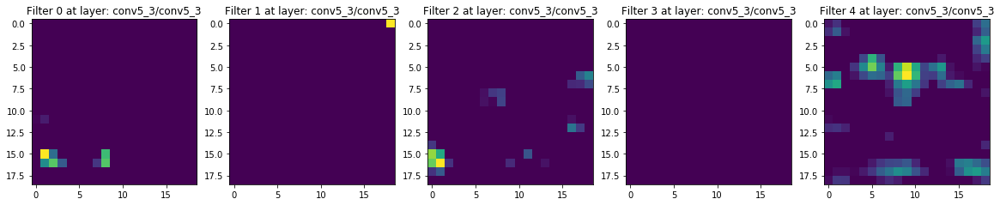

In [39]:
# Visualizing and controlling the layers used 

model = vgg16.VGG16()

# Create a TensorFlow-session.
session = tf.InteractiveSession(graph=model.graph)

# Print the names of the content-layers.
print("Content layers:")
print(model.get_layer_names(content_layer_ids))
print()

visualize_layers(session,model,content_image,content_layer_ids)

# Print the names of the style-layers.
print("Style layers:")
print(model.get_layer_names(style_layer_ids))
print()

visualize_layers(session,model,style_image,style_layer_ids)

()
('Iteration:', 0)
Weight Adj. for Content: 5.47e-11, Style: 3.22e-28, Denoise: 5.57e-06


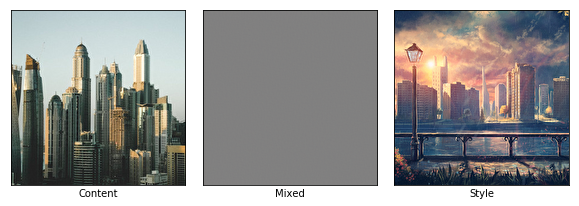

()
('Iteration:', 1000)
Weight Adj. for Content: 9.33e-11, Style: 3.39e-25, Denoise: 2.15e-07


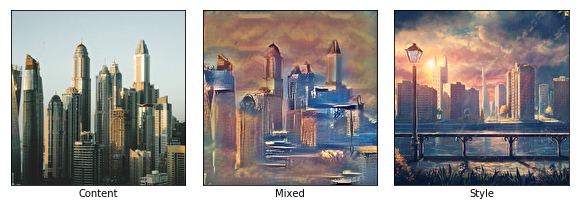

()
('Iteration:', 1999)
Weight Adj. for Content: 9.06e-11, Style: 6.01e-25, Denoise: 2.08e-07


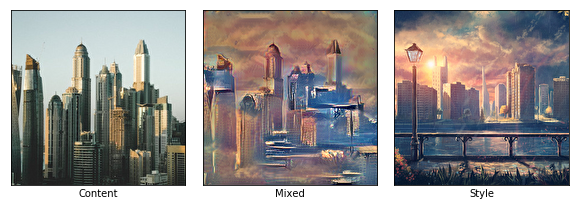

()
Final image:


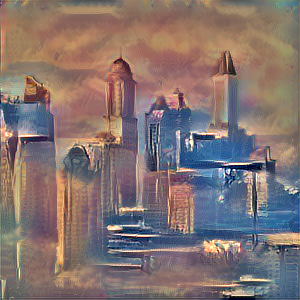

In [40]:
# Visualizing and controlling the layers used 

model = vgg16.VGG16()

# Create a TensorFlow-session.
session = tf.InteractiveSession(graph=model.graph)

img = style_transfer(model, session, content_image=content_image,
                     style_image=style_image,
                     content_layer_ids=content_layer_ids,
                     style_layer_ids=style_layer_ids,
                     weight_content=5.0,
                     weight_style=5.0,
                     weight_denoise=0.3,
                     num_iterations=2000,
                     step_size=0.5)